# Taller 2 - Estudio Comparativo de Clasificadoreso

**Curso: Machine Learning y Deep Learning**

**Diplomado en Data Science**

Nombre: Dr. Ing. Rodrigo Salas (rodrigo.salas@uv.cl)


- Nombre integrante 1:Juan Pablo González Collao
- Nombre integrante 2:Pablo Omar Walters Barraza
- Nombre integrante 3:

Fecha de entrega: Lunes 11 de Julio 2022

A continuación coloque todos los toolbox que utilizó para el desarrollo de esta actividad.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.svm import SVC
from scipy.stats import spearmanr
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestClassifier
from scipy.cluster import hierarchy
#from google.colab import drive
#drive.mount('/content/drive')

# 1. Estudio Comparativo de Clasificadores (30 puntos)

En esta pregunta se realizará un estudio comparativo de los desempeños de los clasificadores para realizar una tarea en particular. Para realizar esta actividad, su equipo deberá escoger uno de los siguientes conjuntos de datos:

- [Parkinsons](https://archive.ics.uci.edu/ml/datasets/Parkinsons)
- [Wisconsin Breast Cancer](https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29)
- [Bank Marketing](https://archive.ics.uci.edu/ml/datasets/Bank+Marketing)
- [Student Performance](https://archive.ics.uci.edu/ml/datasets/Student+Performance)
- [Heart Disease Data Set](https://archive.ics.uci.edu/ml/datasets/Heart+Disease)

Sólo se deberá escoger un solo conjunto de datos.


**1.1.** Realizar la lectura del archivo y guardar la información en un DataFrame de pandas

In [2]:
df = pd.read_csv('C:\\Users\\pablo.walters\\Desktop\\clase\\taller 2\\breast cancer.csv', sep = ',')
#df=pd.read_csv('/content/drive/MyDrive/lab mod 4/Tarea 2/breast cancer.csv')
df["diagnosis"]=df["diagnosis"].replace("M", 0)
df["diagnosis"]=df["diagnosis"].replace("B", 1)

#df['diagnosis']=df[df['diagnosis']=="M"]=1
#df['diagnosis']=df[df['diagnosis']=="B"]=0
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [3]:
df["diagnosis"].value_counts()

1    357
0    212
Name: diagnosis, dtype: int64

In [4]:
df1=pd.read_csv(('C:\\Users\\pablo.walters\\Desktop\\clase\\taller 2\\processed.cleveland.csv'), sep=",", names=['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','num'])
df1 = df1[df1['thal'] != "?"]
df1 = df1[df1['ca'] != "?"]
df1['age']=df1['age'].astype(float)
df1['sex']=df1['sex'].astype(float)
df1['cp']=df1['cp'].astype(float)

df1['trestbps']=df1['trestbps'].astype(float)
df1['chol']=df1['chol'].astype(float)
df1['fbs']=df1['fbs'].astype(float)
df1['restecg']=df1['restecg'].astype(float)
df1['thalach']=df1['thalach'].astype(float)
df1['exang']=df1['exang'].astype(float)
df1['oldpeak']=df1['oldpeak'].astype(float)
df1['slope']=df1['slope'].astype(float)
df1['ca']=df1['ca'].astype(float)
df1['thal']=df1['thal'].astype(float)
df1['num']=df1['num'].astype(float)
df1["num"]=df1["num"].replace(4, 1).replace(3, 1).replace(2, 1)
df1

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0.0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,1.0
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1.0
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0.0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,4.0,140.0,241.0,0.0,0.0,123.0,1.0,0.2,2.0,0.0,7.0,1.0
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1.0
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,1.0
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,1.0


In [5]:
df1["num"].value_counts()

0.0    160
1.0    137
Name: num, dtype: int64

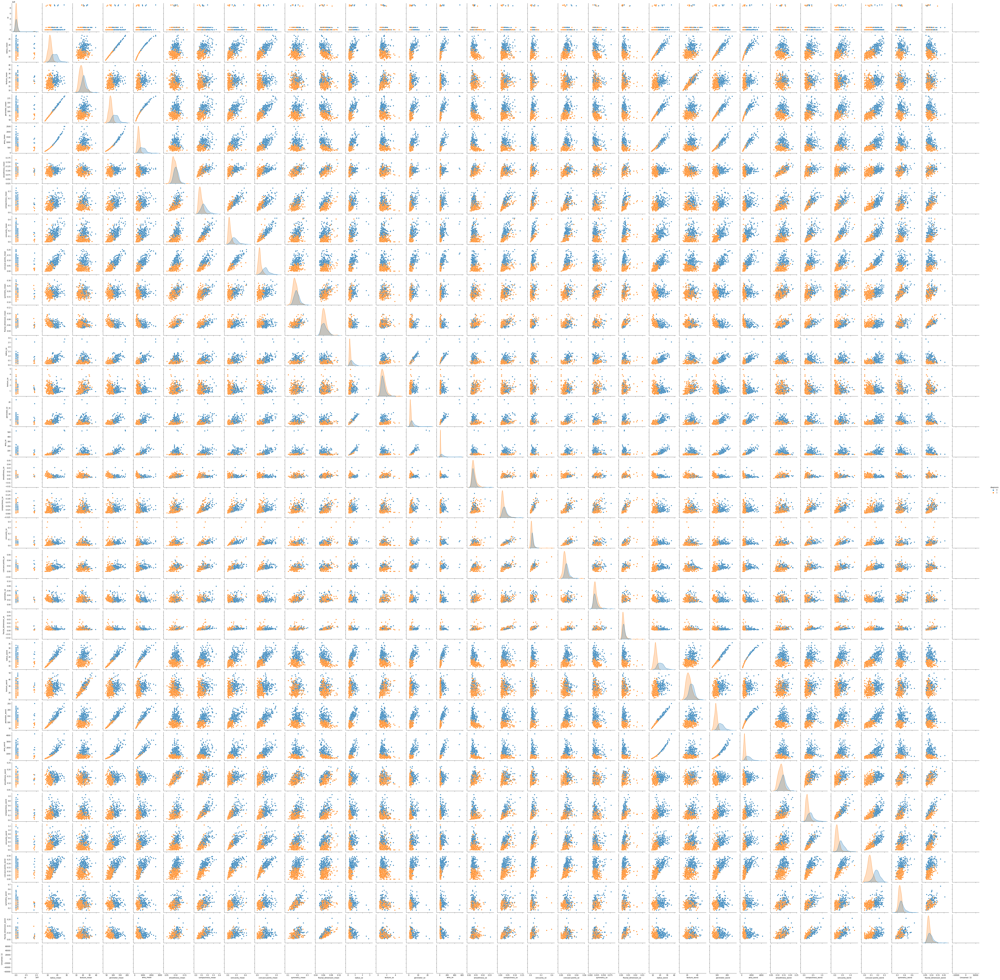

In [6]:
sns.pairplot(df,hue='diagnosis')

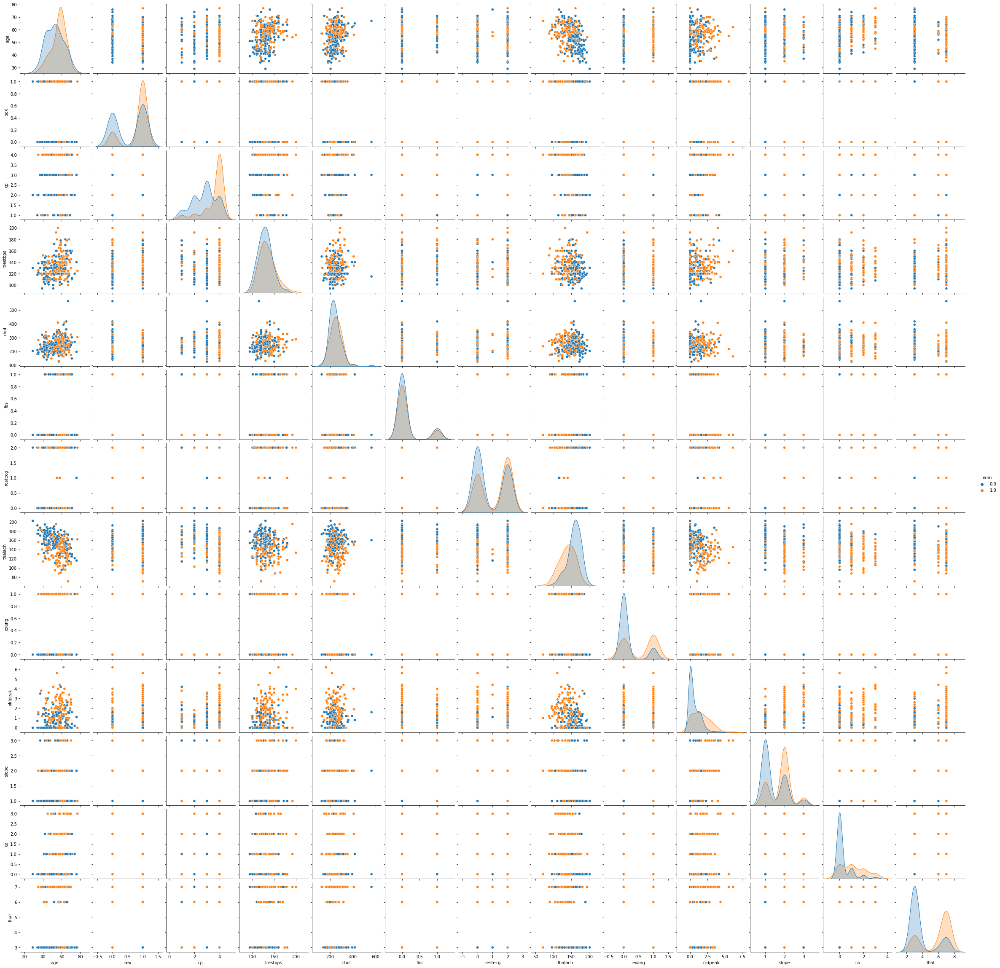

In [7]:
sns.pairplot(df1,hue='num')

**1.2.** Explicar brevemente cuál es el objetivo de este conjunto de datos. Indicar cuánto es la cantidad de datos, cuántas variables de entradas se tienen, cuántas son la cantidad de clases. Explicar brevemente el significado de la variable target. Explicar brevemente el significado de 5 variables de entrada.

**Set de cancer de mama:**

El dataset se trata de una serie de observaciones relacionadas a las características del núcleo celular de diferentes muestras de tejido mamario. Las muestras de tejido mamario son obtenidas a través de la aspiración con aguja fina (FNA) y los datos relacionados a las distintas características morfológicas, son obtenidos a través de imagenes digitalizadas. El objetivo de esta información es caracterizar morfológicamente los núcleos celulares de muestras de tejido mamario con y sin cáncer, para generar un modelo que prediga la existencia de cáncer.

El dataset contiene 570 observaciones y 31 variables (incluyendo un ID y el target).
Es decir, se tienen 29 variables de entrada para 2 clases, donde un 62,7% de las observaciones corresponde a tumores malignos y un 37,3% a tumores benignos (Benigno=0 y Maligno=1) 
A continuación, explicación breve de 5 variables de entrada:

* radius_mean: corresponde al promedio del radio del núcleo celular, es decir distancias del centro a los puntos del perímetro.

* texture_mean: corresponde a la desviación estándar de los valores de la escala de grises
* perimeter_mean: corresponde al promedio del perímetro de los núcleos celulares
* concavity: severidad de las porciones cóncavas del contorno)
* concave points: número de porciones cóncavas del contorno


**Set de enfermedades del cardiacas:**

El dataset consiste en la selección de un subconjunto de 14 variables de 76 variables originales (características y síntomas de pacientes) asociadas a un diagnóstico de enfermedad cardiaca a partir de una angiografía.  El objetivo de esta información es predecir la enfermedad cardiaca, a partir de la observación de características y síntomas de pacientes.
	
El dataset contiene 298 observaciones y 14 variables (incluyendo el target).

Es decir, se tienen 13 variables de entrada para 5 clases, donde un 45,9% de las observaciones corresponde a algún grado de enfermedad cardiaca y un 54,1% a la inexistencia de enfermedad cardiaca. Cabe destacar, que para efectos del modelo, se consideran 2 clases (sano=0 y enfermo=1) 
A continuación, explicación breve de 5 variables de entrada:

* trestbps: tensión arterial en reposo (en mm Hg al ingreso hospitalario)
* chol: colestoral sérico en mg/dl
* fbs: glucemia en ayunas mayor o menor a 120 mg/dl. (mayor:1, menor: 0)
* restecg: resultados electrocardiográficos en reposo (normal:0, anormal: 1 y 2)
* thalach: frecuencia cardíaca máxima alcanzada


**1.3.** Serarar el conjunto de datos en una matriz $X$ con las variables de entrada y en el target $y$

In [8]:
target=df['diagnosis']
variables=df.drop(columns=["id","diagnosis","Unnamed: 32"])

In [9]:
target1=df1['num']
variables1=df1.drop(columns="num")

**1.4.** Separar el conjunto de datos en conjunto de entrenamiento y en conjunto de test. Considerar el $70\%$ de los datos para entrenamiento. (Se sugiere no utilizar semilla de forma tal que las particiones sean aleatorias)

In [10]:
## Cancer de mama
X_training, X_test, y_training, y_test = train_test_split(variables, target, test_size = 0.3)

In [11]:
## Corazón
X_training1, X_test1, y_training1, y_test1 = train_test_split(variables1, target1, test_size = 0.3)

**1.5.** Estandarizar los datos de entrada del conjunto de entrenamiento y test utilizando el "standard scaler". (El standar scaler se ajusta al conjunto de entranamiento y luego se transforman los datos del conjunto de entrenamiento y el de test)

In [12]:
## Cancer de mama

sc = StandardScaler()
sc.fit(X_training) 

Z_train = sc.transform(X_training)
Z_test = sc.transform(X_test)

In [13]:
## Corazón
sc = StandardScaler()
sc.fit(X_training1) 

Z_train1 = sc.transform(X_training1)
Z_test1 = sc.transform(X_test1)

In [48]:
#Función para obtener parametros de desempeño
def desempeño(y_pred,y_real):
  desempeno=[]

  vp=confusion_matrix(y_pred, y_real)[0][0]
  fp=confusion_matrix(y_pred, y_real)[0][1]
  fn=confusion_matrix(y_pred, y_real)[1][0]
  vn=confusion_matrix(y_pred, y_real)[1][1]


  desempeno.append(accuracy_score(y_pred,y_real))
  sensibilidad=vp/(vp+fn)
  desempeno.append(sensibilidad)
  especificidad=vn/(vn+fp)
  desempeno.append(especificidad)
  p_negativo=vn/(vn+fn)
  desempeno.append(p_negativo)
  precision=vp/(vp+fp)
  desempeno.append(precision)
  t_error=(1-accuracy_score(y_pred,y_real))
  desempeno.append(t_error)
  medida_f=2*((precision*sensibilidad)/(precision+sensibilidad))
  desempeno.append(medida_f)

  
  return desempeno

**1.6.** Aplicar los siguentes modelos de Scikit Learn:

- LDA
- QDA
- SVC Lineal
- SVC Radio Basal
- Random Forest
- Gradient Boosting
- Multilayer Perceptron

y obtener las siguientes métricas de desempeño:

- Accuracy (Exactitud)
- Sensibilidad
- Precisión
- Especificidad
- Tasa de Error
- Medida F

Realizar una tabla comparativa y concluir.


In [49]:
classificacion=[]

## LDA

lda = LinearDiscriminantAnalysis(solver="svd")
y_lda = lda.fit(Z_train, y_training).predict(Z_test)
classificacion.append(desempeño(y_lda,y_test))

## QDA

qda = QuadraticDiscriminantAnalysis()
y_qda = qda.fit(Z_train, y_training).predict(Z_test)
classificacion.append(desempeño(y_qda,y_test))

## SVC Lineal

SVCL = SVC(kernel='linear', C=1E6).fit(Z_train,y_training)
y_svc_lineal=SVCL.predict(Z_test)
classificacion.append(desempeño(y_svc_lineal,y_test))

## SVC radio basal
SVCR = SVC(kernel='rbf', C=1E6).fit(Z_train, y_training)
y_svc_radial=SVCR.predict(Z_test)
classificacion.append(desempeño(y_svc_radial,y_test))

## Random Forest
RF = RandomForestClassifier().fit(Z_train, y_training)
y_rf=RF.predict(Z_test)
classificacion.append(desempeño(y_rf,y_test))

## Gradient Boosting
GB = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1).fit(Z_train, y_training)
y_gb=GB.predict(Z_test)
classificacion.append(desempeño(y_gb,y_test))

## Multilayer Perceptron
MLP = MLPClassifier(max_iter=300).fit(Z_train, y_training)
y_mpl=MLP.predict(Z_test)
classificacion.append(desempeño(y_mpl,y_test))


In [50]:
classificacion1=[]

## LDA

lda = LinearDiscriminantAnalysis(solver="svd")
y_lda1 = lda.fit(Z_train1, y_training1).predict(Z_test1)
classificacion1.append(desempeño(y_lda1,y_test1))
#print("LDA",confusion_matrix(y_lda1,y_test1))
## QDA

qda = QuadraticDiscriminantAnalysis()
y_qda1 = qda.fit(Z_train1, y_training1).predict(Z_test1)
classificacion1.append(desempeño(y_qda1,y_test1))

#print("QDA",confusion_matrix(y_qda1,y_test1))

## SVC Lineal

SVCL = SVC(kernel='linear', C=1E3).fit(Z_train1,y_training1)
y_svc_lineal1=SVCL.predict(Z_test1)
classificacion1.append(desempeño(y_svc_lineal1,y_test1))

#print("SVC Lineal",confusion_matrix(y_svc_lineal1,y_test1))

## SVC radio basal
SVCR = SVC(kernel='rbf', C=1E3).fit(Z_train1, y_training1)
y_svc_radial1=SVCR.predict(Z_test1)
classificacion1.append(desempeño(y_svc_radial1,y_test1))

#print("SVC radio basal",confusion_matrix(y_svc_radial1,y_test1))

## Random Forest
RF = RandomForestClassifier().fit(Z_train1, y_training1)
y_rf1=RF.predict(Z_test1)
classificacion1.append(desempeño(y_rf1,y_test1))

#print("Random Forest",confusion_matrix(y_rf1,y_test1))

## Gradient Boosting
GB = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1).fit(Z_train1, y_training1)
y_gb1=GB.predict(Z_test1)
classificacion1.append(desempeño(y_gb1,y_test1))

#print("Gradient Boosting",confusion_matrix(y_gb1,y_test1))

## Multilayer Perceptron
MLP = MLPClassifier(max_iter=300).fit(Z_train1, y_training1)
y_mpl1=MLP.predict(Z_test1)
classificacion1.append(desempeño(y_mpl1,y_test1))

#print("Multilayer Perceptron",confusion_matrix(y_mpl1,y_test1))

C:\Users\pablo.walters\Anaconda3\envs\Modulo4\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


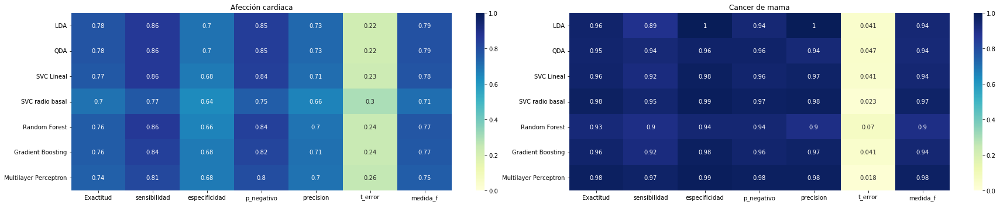

In [51]:
plt.rcParams["figure.figsize"] = [25, 5]
plt.rcParams["figure.autolayout"] = True

rty = pd.DataFrame(classificacion,index=['LDA','QDA','SVC Lineal','SVC radio basal','Random Forest','Gradient Boosting','Multilayer Perceptron'],columns=['Exactitud','sensibilidad','especificidad','p_negativo','precision','t_error','medida_f'])
rty1=pd.DataFrame(classificacion1,index=['LDA','QDA','SVC Lineal','SVC radio basal','Random Forest','Gradient Boosting','Multilayer Perceptron'],columns=['Exactitud','sensibilidad','especificidad','p_negativo','precision','t_error','medida_f'])

fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.subplots_adjust(wspace=0.01)

sns.heatmap(rty1,vmax=1,vmin=0,annot=classificacion1, cmap="YlGnBu", ax=ax1).set_title('Afección cardiaca')
sns.heatmap(rty,vmax=1,vmin=0,annot=classificacion, cmap="YlGnBu", ax=ax2).set_title('Cancer de mama')



#ax2.yaxis.tick_right()

fig.subplots_adjust(wspace=0.001)
plt.show()

**Desempeño de Modelos**

Respecto de la Exactitud, el desempeño de los modelos es bastante similar para ambos dataset. en el caso del cáncer de mama, cuyo dataset contiene mayor cantidad de variables y con mayor variabilidad, el mejor desempeño se obtuvo con el modelo Multilayer Perception, el cual tuvo el mejor rendimiento a excepción de las métricas especificidad y precisión.
A diferencia de lo anterior, el dataset de afección cardiaca muestra un mejor desempeño con los modelos más simples (LDA y QDA), donde además, mostró mejor rendimiento en todas las métricas.
Cabe destacar que se obtuvieron mejores desempeños en la aplicación de los modelos en el dataset que contiene una mayor cantidad de datos, variables y variabilidad de los datos. En el caso del dataset de afecciones cardiacas, se utilizaron variables de entrada nominales y ordinales.


# 2. Estudio de Variables Relevantes (30 puntos)

En esta pregunta se estudiarán las variables (Features) más relevantes para la predicción.

**2.1** Realizar un estudio de colinealidad. Para ello deberá obtener la matriz de correlación y aplicar un Jerárquical Clustering. Graficar la matriz de correlación y el dendograma. Concluir sobre los resultados.



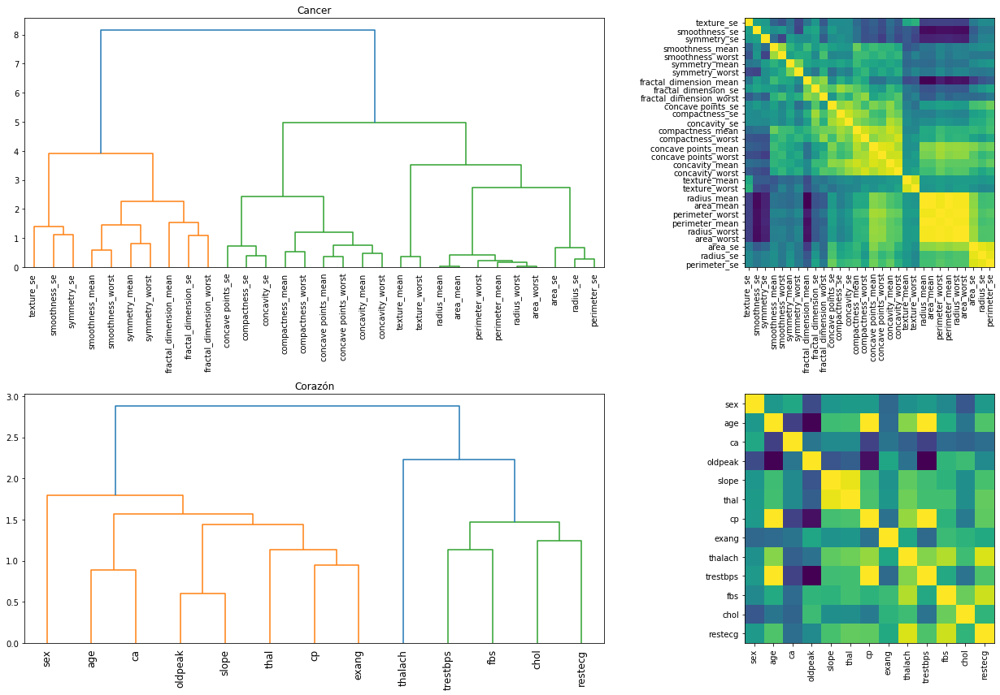

In [18]:
fig, ax = plt.subplots(2, 2, figsize=(20, 12))
corr = spearmanr(Z_train).correlation
corr_linkage = hierarchy.ward(corr)
dendro = hierarchy.dendrogram(corr_linkage, labels=X_training.columns, ax=ax[0][0], leaf_rotation=90)
ax[0][0].set_title("Cancer")
dendro_idx = np.arange(0, len(dendro['ivl']))

ax[0][1].imshow(corr[dendro['leaves'], :][:, dendro['leaves']])
ax[0][1].set_xticks(dendro_idx)
ax[0][1].set_yticks(dendro_idx)
ax[0][1].set_xticklabels(dendro['ivl'], rotation='vertical')
ax[0][1].set_yticklabels(dendro['ivl'])
fig.tight_layout()

corr2 = spearmanr(Z_train1).correlation
corr_linkage2 = hierarchy.ward(corr2)
dendro1 = hierarchy.dendrogram(corr_linkage2, labels=X_training1.columns, ax=ax[1][0], leaf_rotation=90)
ax[1][0].set_title("Corazón")
dendro_idx1 = np.arange(0, len(dendro1['ivl']))
ax[1][1].imshow(corr[dendro1['leaves'], :][:, dendro1['leaves']])
#ax[1][1].imshow(corr1[dendro1['leaves'], :][:, dendro1['leaves']])
ax[1][1].set_xticks(dendro_idx1)
ax[1][1].set_yticks(dendro_idx1)
ax[1][1].set_xticklabels(dendro1['ivl'], rotation='vertical')
ax[1][1].set_yticklabels(dendro1['ivl'])
plt.show()

**Clustering**

En el dendograma del dataset cáncer de mama, haciendo un corte en el nivel 4, se pueden observar claramente 3 clúster bien diferenciados entre sí, y con una alta similitud interna, lo cual se comprueba en la observación de la matriz de correlaciones, sin embargo, se puede destacar que las variables dentro del clúster de mayor correlación son variables correlacionadas entre sí (área, radio y perímetro), lo que también ocurre con los demás clúster, pero en menor medida. Por lo tanto, estas variables entregan información redundante, por lo cual se podría seleccionar un features por cada clúster y obtener una similar exactitud.

Por otro lado, en el dendograma del dataset de afecciones cardiacas se pueden diferenciar claramente solo 3 cluster, haciendo un corte en el nivel 2, dada la baja disimilaridad entre las agrupaciones observadas. Cabe destacar que la variable thalach, que corresponde a la frecuencia cardiaca, es un clúster por sí mismo, ya que no está vinculado a otra variable.


**2.2** Aplicar el método de Random Forest al conjunto de datos de entrenamiento y obtener un gráfico de barras para el ranking de las variables más relevantes. Concluir respecto a las dos primeras variables seleccionadas.

In [27]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_training, y_training)
print("Accuracy Cancer",clf.score(Z_test, y_test))

clf1 = RandomForestClassifier(n_estimators=100, random_state=42)
clf1.fit(X_training1, y_training1)
print("Accuracy Corazón:",clf1.score(Z_test1, y_test1))

Accuracy Cancer 0.6549707602339181
Accuracy Corazón: 0.4888888888888889


In [28]:
result = permutation_importance(clf, X_training, y_training, n_repeats=100)
result1 = permutation_importance(clf1, X_training1, y_training1, n_repeats=100)

[0.09228843 0.02899791 0.10442151 0.06935471 0.08969668 0.00673601
 0.01942651 0.12870564 0.04903042 0.12674418 0.04268079 0.1187597
 0.12315751]


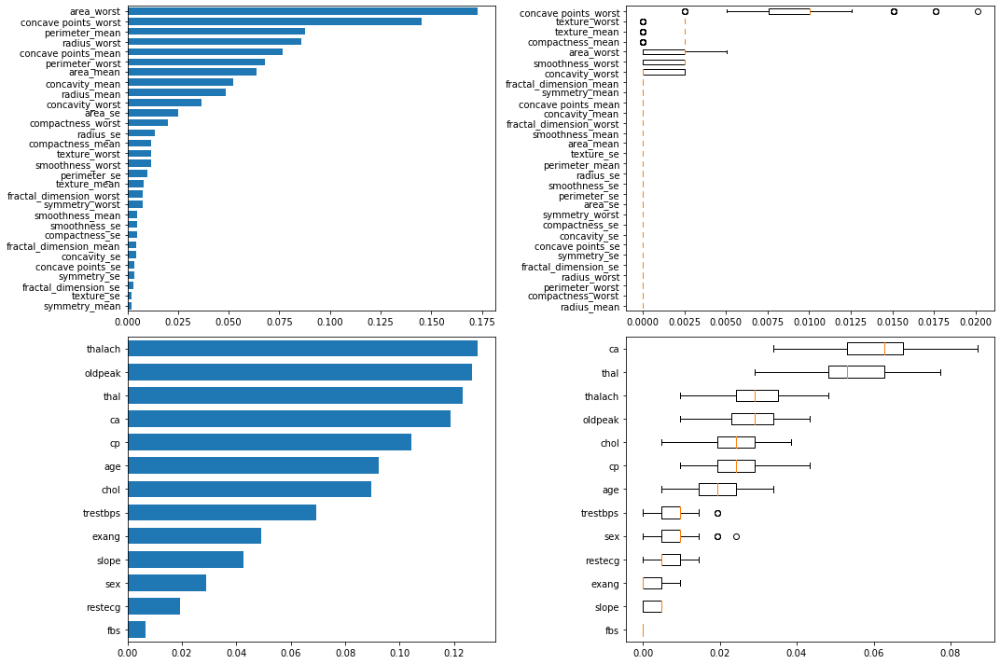

In [29]:
perm_sorted_idx = result.importances_mean.argsort()
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5


perm_sorted_idx1 = result1.importances_mean.argsort()
tree_importance_sorted_idx1 = np.argsort(clf1.feature_importances_)
tree_indices1 = np.arange(0, len(clf1.feature_importances_)) + 0.5



fig, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0][0].barh(tree_indices,clf.feature_importances_[tree_importance_sorted_idx], height=0.7)
ax[0][0].set_yticklabels(X_training.columns[tree_importance_sorted_idx])
ax[0][0].set_yticks(tree_indices)
ax[0][0].set_ylim((0, len(clf.feature_importances_)))
ax[0][1].boxplot(result.importances[perm_sorted_idx].T, vert=False,
            labels=X_training.columns[perm_sorted_idx])

print(clf1.feature_importances_)
ax[1][0].barh(tree_indices1,clf1.feature_importances_[tree_importance_sorted_idx1], height=0.7)
ax[1][0].set_yticklabels(X_training1.columns[tree_importance_sorted_idx1])
ax[1][0].set_yticks(tree_indices1)
ax[1][0].set_ylim((0, len(clf1.feature_importances_)))
ax[1][1].boxplot(result1.importances[perm_sorted_idx1].T, vert=False, labels=X_training1.columns[perm_sorted_idx1])




fig.tight_layout()
plt.show()

**Random Forest**

Aplicando Random forest a ambos dataset, con 100 árboles, se obtiene un bajo desempeño en exactitud con valores cercanos al 50 y 60%.

Se puede observar en la gráfica de importancia de los Features de acuerdo al random forest, del cáncer de mama, que los primeros del ranking, no se encuentran en el mismo orden en la grafica de variabilidad (100 repeticiones). además, se observa una alta variabilidad de los Features de mayor importancia.

Lo anterior ocurre de forma similar, aplicando el randomforest al dataset de enefermedad cardiaca.
A pesar de esta variabilidad, los modelos mantienen su exactitud, al volver a ejecutar el código, se puede observar un cambio en la importancia de los Features, sin cambiar de forma relevante su desempeño. Lo anterior da cuenta de que existen muchas variables que aportan información redundante al modelo, y que por lo tanto, se podría prescindir de algunas.


**2.3** Seleccionar las variables más relevantes según su criterio y volver a entrenar el random forest con las nuevas variables. Obtener las métricas de desempeño para el conjunto de Test. Concluir.

In [31]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_training[[ 'concavity_mean',
       'perimeter_worst', 'concave points_mean', 'area_worst',
       'concave points_worst']], y_training)
print("Nueva Accuracy cancer",(clf.score(X_test[[ 'concavity_mean',
       'perimeter_worst', 'concave points_mean', 'area_worst',
       'concave points_worst']], y_test)))

clf1 = RandomForestClassifier(n_estimators=100, random_state=42)
clf1.fit(X_training1[["cp","ca","thal","age","thalach"]], y_training1)
print("Nueva Accuracy corazón",clf1.score(X_test1[["cp","ca","thal","age","thalach"]], y_test1))



Nueva Accuracy cancer 0.9239766081871345
Nueva Accuracy corazón 0.7666666666666667


**Random Forest aplicado a variables seleccionadas**

Al aplicar Random forest considerando las variables mejores ranqueadas en orden de importancia, para ambos dataset, se obtienen exactitudes considerablemente mayores, aumentando del orden de 27 puntos porcentuales su desempeño.

**2.4.** Aplicar la técnica de PCA y obtener el gráfico de Biplot. Concluir sobre los resultados.

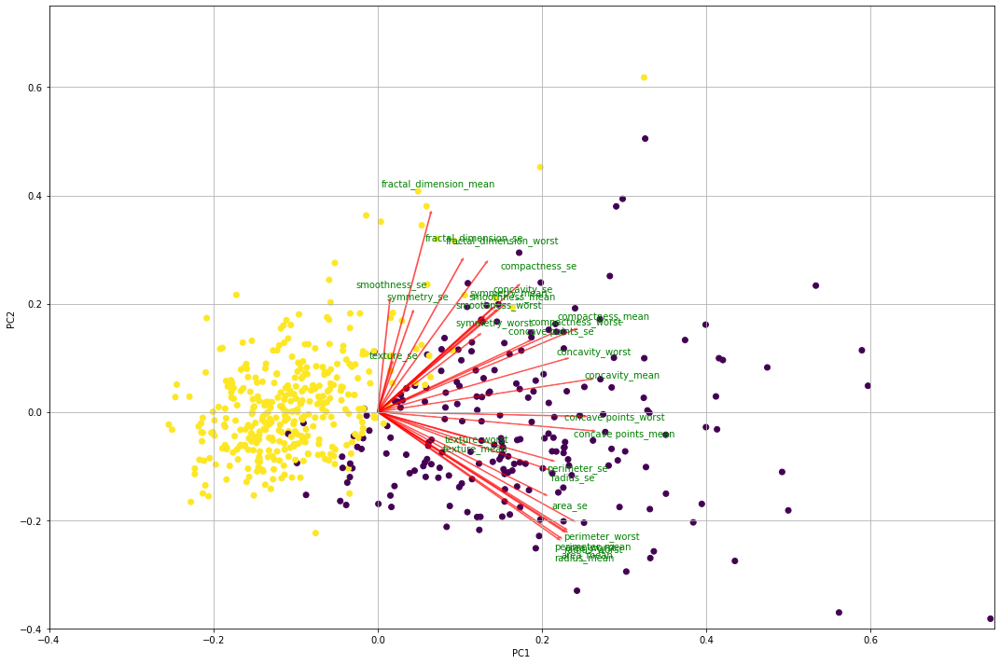

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler


plt.figure(figsize=(15,10))

X = variables
y = target


# In general, it's a good idea to scale the data prior to PCA.
scaler = StandardScaler()
scaler.fit(X)
X=scaler.transform(X)    
pca = PCA()
x_new = pca.fit_transform(X)

def myplot(score,coeff,X,labels=None):
    
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, X.columns[i], color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, X.columns[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-.4,.75)
    plt.ylim(-.4,.75)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

#Call the function. Use only the 2 PCs.
myplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]),X_training)
plt.show()

In [24]:
pca.components_

array([[ 2.18902444e-01,  1.03724578e-01,  2.27537293e-01,
         2.20994985e-01,  1.42589694e-01,  2.39285354e-01,
         2.58400481e-01,  2.60853758e-01,  1.38166959e-01,
         6.43633464e-02,  2.05978776e-01,  1.74280281e-02,
         2.11325916e-01,  2.02869635e-01,  1.45314521e-02,
         1.70393451e-01,  1.53589790e-01,  1.83417397e-01,
         4.24984216e-02,  1.02568322e-01,  2.27996634e-01,
         1.04469325e-01,  2.36639681e-01,  2.24870533e-01,
         1.27952561e-01,  2.10095880e-01,  2.28767533e-01,
         2.50885971e-01,  1.22904556e-01,  1.31783943e-01],
       [-2.33857132e-01, -5.97060883e-02, -2.15181361e-01,
        -2.31076711e-01,  1.86113023e-01,  1.51891610e-01,
         6.01653628e-02, -3.47675005e-02,  1.90348770e-01,
         3.66575471e-01, -1.05552152e-01,  8.99796818e-02,
        -8.94572342e-02, -1.52292628e-01,  2.04430453e-01,
         2.32715896e-01,  1.97207283e-01,  1.30321560e-01,
         1.83848000e-01,  2.80092027e-01, -2.19866379e-

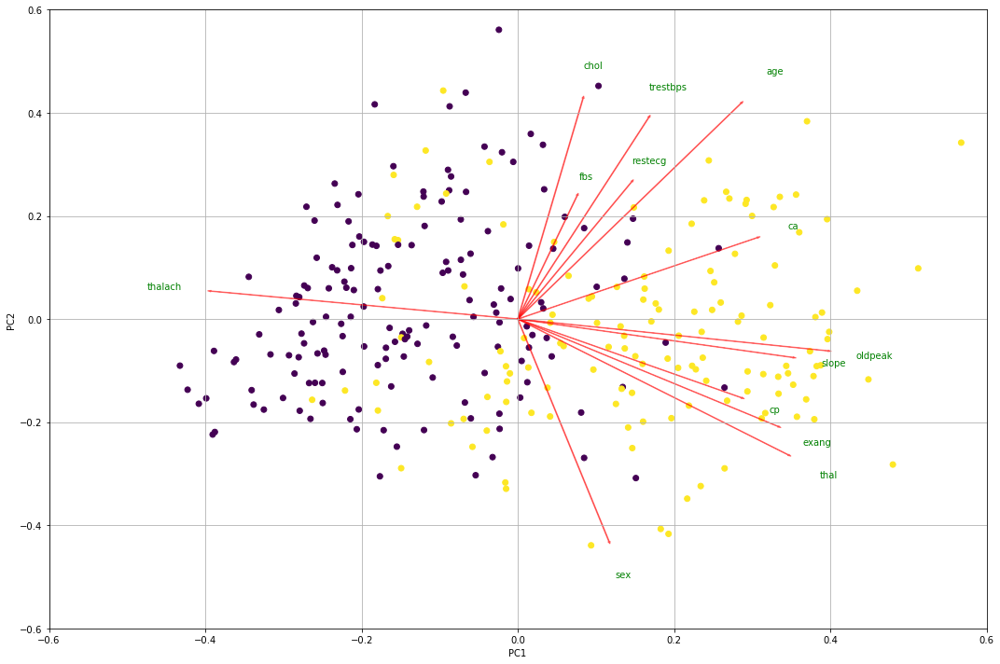

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler


plt.figure(figsize=(15,10))

X = variables1
y = target1


# In general, it's a good idea to scale the data prior to PCA.
scaler = StandardScaler()
scaler.fit(X)
X=scaler.transform(X)    
pca = PCA()
x_new = pca.fit_transform(X)

def myplot(score,coeff,X,labels=None):
    
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, X.columns[i], color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, X.columns[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-.6,.6)
    plt.ylim(-.6,.6)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

#Call the function. Use only the 2 PCs.
myplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]),X_training1)
plt.show()

In [26]:
pca.components_

array([[ 0.28586758,  0.11680189,  0.28621211,  0.16784082,  0.08350419,
         0.07609387,  0.14593784, -0.39270583,  0.33313953,  0.39700637,
         0.3520241 ,  0.30641953,  0.34620842],
       [ 0.41866153, -0.431579  , -0.15253955,  0.39151404,  0.42820138,
         0.23985575,  0.26651507,  0.05414681, -0.2082855 , -0.06174634,
        -0.07449081,  0.15784224, -0.26344384],
       [-0.01261961,  0.48369265, -0.40887336,  0.31463151, -0.2600399 ,
         0.51477575,  0.07196171,  0.21882111, -0.19663643,  0.0454429 ,
         0.00149273,  0.0914224 ,  0.25484219],
       [-0.12419567, -0.2554797 , -0.32658925,  0.18685395, -0.19084194,
        -0.15145133,  0.00173282, -0.02090758, -0.11956303,  0.40946106,
         0.58672122, -0.40292598, -0.17142789],
       [ 0.33301471, -0.22056993, -0.03559127, -0.08463981, -0.40076951,
         0.21497083, -0.66229013, -0.30341471, -0.17926828, -0.02905481,
        -0.00673187,  0.21507271, -0.12336624],
       [-0.13706318, -0.124150

**PCA**

Se puede observar en el gráfico Biplot una coincidencia entre las variables de mayor importancia según el randomforest y las variables cuyos vectores atraviesan una mayor variabilidad de los puntos en el hiperplano y por lo tanto, las variables que permiten la separación de clases.

En el caso de los datos de cancer, como existe correlación entre las variables de entrada al modelo, los vectores observados tienen magnitud y dirección similares entre sí. De acuerdo a la gráfica, se pueden destacar las siguientes variables: perimeter_worst, concave points_mean y area_worst.

En el caso de los datos de cancer, donde existen menores variables de entrada, se pueden identificar claramente las variables de mayor relevancia para la separación de clases. se pueden destacar las siguientes variables: thalach, ca y cp.


**Conclusión de la actividad:**

Al evaluar los distintos modelos (clasificadores y clustering) en el dataset de diferentes características, se puede concluir que el desempeño de los modelos no mejora necesariamente en función de su complejidad, es decir, existen modelos más adecuados para las características y objetivos que se tienen para el conjunto de datos.
En este caso particular, los modelos más simples, tuvieron el mejor desempeño para el dataset de menores volumen de datos, variable y variabilidad.

En el caso de la data más compleja, se obtuvo desempeños altos para tofos los modelos evaluados, destacando un modelo de clustering.

Al aplicar clustering jerárquico, y randomforest, se pudo identificar con claridad, las variables que representan un mayor peso para predicción del target.

Respecto del PCA, se pudo comprobar de forma gráfica la coincidencia de las variables de mayor importancia detectadas con el clustering. Si se hubiera aplicado inicialmente el PCA, se podría haber seleccionado las variables predictoras de mayor importancia para la aplicación de los modelos.
